In [ ]:
from IPython.display import display, HTML

html_code = """
<div style="display: flex; justify-content: center;">
    <img src="https://www.moati.com.au/wp-content/uploads/2022/05/knee-arthritis-surgery.jpg" alt="Descripción" style="width: 100%;">
</div>
"""
display(HTML(html_code))

##### Set up - enviroment

In [ ]:
# Standard library imports
import os

# Third-party imports
import cv2
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import Image, display
from google.colab import drive
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

# TensorFlow/Keras imports
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import backend as K
from tensorflow.keras import layers, models, optimizers, regularizers
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.callbacks import (CSVLogger, EarlyStopping,
                                       ModelCheckpoint, TensorBoard, ReduceLROnPlateau)
from tensorflow.keras.layers import (Activation, Add, AveragePooling2D,
                                    BatchNormalization, Concatenate, Conv2D,
                                    Dense, Dropout, Flatten,
                                    GlobalAveragePooling2D, GlobalMaxPooling2D,
                                    Input, Lambda, MaxPooling2D, Multiply,
                                    Reshape, SeparableConv2D)
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import DenseNet121
from sklearn.metrics import classification_report
from tensorflow.keras.applications import EfficientNetB4
import numpy as np

%pip install tf-keras-vis
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 4.4 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
%cd /content/drive/MyDrive/'Colab Notebooks'/'Capstone Project'/'Modeling'/'Efficient-Net'

/content/drive/MyDrive/Colab Notebooks/Capstone Project/Modeling/Efficient-Net


In [ ]:
%ls

best_model_efficient_net.keras/   export/
Efficient-Net-Capstone-CNN.ipynb  _logger_efficient_net/


### Summary - Modeling

Características clave:


1. Fine-Tuning Inteligente:

2. Evalúa el accuracy después del entrenamiento inicial

  * Realiza fine-tuning automático si el accuracy < 80%

  * Descongela solo las últimas capas para evitar overfitting

3. Preprocesamiento Integrado:

  *  Convierte imágenes MNIST (380*380, 1 canal) al formato requerido (380*380, 3 canales)

  * Normaliza los valores de píxeles

4. Serialización Completa:

  * Guarda todo el objeto modelo (incluyendo pesos y configuración)

  * Puede cargarse en otro proyecto sin necesidad de código adicional

Esta implementación proporciona un balance óptimo entre facilidad de uso y rendimiento, adaptándose automáticamente a los datos mediante el fine-tuning cuando es necesario.



Ventajas de este Diseño
1. Bajo acoplamiento:

  * Cada clase tiene una sola responsabilidad

  * Fácil modificar componentes individuales

2. Alta cohesión:

  * Todo el código relacionado con evaluación está en Evaluator

  * Toda la lógica de logging en TrainingMonitor

3. Extensibilidad:

  * Añadir nuevos callbacks sin modificar la lógica principal

  * Fácil integrar nuevas visualizaciones

4. Reusabilidad:

  * TrainingMonitor y Evaluator pueden usarse con otros modelos

  * Sistema de logging independiente del modelo específico

5. Organización automática:

  * Estructura de directorios consistente

  * Todos los logs y visualizaciones guardados automáticamente

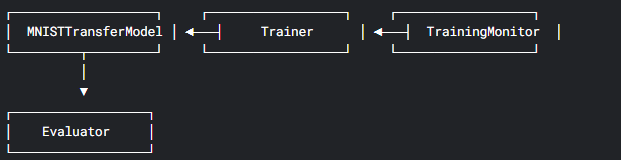

Beneficios Clave
1. Single Responsibility Principle:

  * TrainingMonitor: Exclusivamente para gestión de callbacks y logging

  * Trainer: Solo coordina el proceso de entrenamiento

  * Evaluator: Únicamente para evaluación y visualización

2. Configuración Flexible:



```
python
# Ejemplo: Cambiar métrica monitoreada
monitor = TrainingMonitor()
callbacks = monitor.create_callbacks(monitor_metric='val_accuracy', mode='max')
```



3. Extensibilidad:



```
python
# Añadir nuevo callback sin modificar clases existentes
new_callback = MyCustomCallback()
model.train(..., custom_callbacks=[new_callback])
```

4. Consistencia:

  * Todos los experimentos siguen misma estructura de directorios

  * Configuración de callbacks centralizada

5. Reusabilidad:

  * El sistema de monitorización funciona con cualquier modelo Keras

  * El Trainer puede usarse con diferentes arquitecturas

Este reporte incluye varias métricas clave calculadas para cada clase individualmente y promediadas:

a) Precisión (Precision)
* Fórmula: Verdaderos Positivos / (Verdaderos Positivos + Falsos Positivos)

* Interpretación: De todos los ejemplos que el modelo predijo como clase X, ¿qué porcentaje realmente era de clase X?

* Importancia: Es crucial cuando los falsos positivos son costosos (ej.: diagnóstico médico erróneo).

b) Exhaustividad (Recall/Sensibilidad)

* Fórmula: Verdaderos Positivos / (Verdaderos Positivos + Falsos Negativos)

* Interpretación: De todos los ejemplos que realmente son de clase X, ¿qué porcentaje identificó correctamente el modelo?

* Importancia: Esencial cuando los falsos negativos son críticos (ej.: detectar enfermedades raras).

c) Puntaje F1 (F1-score)

* Fórmula: 2 * (Precision * Recall) / (Precision + Recall)

* Interpretación: Media armónica entre precisión y exhaustividad.

* Importancia: Buen balance cuando necesitas considerar ambos errores (FP y FN).


d) Curvas ROC (Receiver Operating Characteristic)


* Muestra relación entre Tasa de Verdaderos Positivos (Recall) y Tasa de Falsos Positivos.

* AUC (Area Under Curve):

 * 1.0: Clasificador perfecto

 * 0.5: Equivalente a azar

* En multiclase: Se usa estrategia "uno contra el resto" (One-vs-Rest)

* Interpretación: Muestra el rendimiento del modelo en todos los umbrales de decisión posibles.

e) Curvas Precision-Recall

* Muestra elación entre Precisión y Exhaustividad para diferentes umbrales.

* Importancia: Especialmente útil cuando:

 * Las clases están desbalanceadas

 * Nos interesa más la clase positiva que la negativa

* AUC: Área bajo esta curva indica buen rendimiento cuando está cerca de 1.0

Curvas de Aprendizaje


* Muestra cómo evolucionan los scores de entrenamiento y validación según aumenta el tamaño del dataset.

* Patrones importantes:

 * Buen ajuste: Ambas curvas convergen a un valor alto

 * Sobreajuste: Brecha grande entre curvas (train score mucho mayor)

 * Subajuste: Ambas curvas convergen a valor bajo

#### Meeting Data/LoadData

In [ ]:
# Constants
IMG_SIZE = (380, 380)  # Changed from 32x32 to standard ResNet size
BATCH_SIZE = 15
NUM_CLASSES = 5  # For knee arthritis classes
CLASS_NAMES = ['0Normal', '1Doubtful', '2Mild', '3Moderate', '4Severe']

In [ ]:
%ls

best_model_efficient_net.keras/   export/
Efficient-Net-Capstone-CNN.ipynb  _logger_efficient_net/


Knowing data

In [ ]:

# 1) Carga las imágenes crudas (RGB redimensionado) SIN preprocesar
def load_knee_dataset_raw(data_dir):
    raw_images, labels = [], []
    for class_idx, class_name in enumerate(CLASS_NAMES):
        class_dir = os.path.join(data_dir, class_name)
        for img_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_name)
            img = cv2.imread(img_path, cv2.IMREAD_COLOR)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, IMG_SIZE, interpolation=cv2.INTER_LINEAR)
            raw_images.append(img)
            labels.append(class_idx)
    return np.array(raw_images, dtype='uint8'), np.array(labels, dtype='int')

# 2) Función de preprocesamiento (igual que antes)
def preprocess_knee_xray(img, img_size=IMG_SIZE):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = cv2.resize(gray, img_size, interpolation=cv2.INTER_LINEAR)
    gray = gray.astype('float32') / 255.0
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    gray = clahe.apply((gray * 255).astype('uint8')).astype('float32') / 255.0
    gray = cv2.bilateralFilter((gray * 255).astype('uint8'),
                               d=5, sigmaColor=75, sigmaSpace=75)
    gray = gray.astype('float32') / 255.0
    return np.stack([gray, gray, gray], axis=-1)

# 3) Carga raw + preprocess y split
data_dir = '../Training'
X_raw, y = load_knee_dataset_raw(data_dir)
X_proc = np.array([preprocess_knee_xray(img) for img in X_raw], dtype='float32')
y_cat = to_categorical(y, num_classes=NUM_CLASSES)

Xr_train, Xr_test, Xp_train, Xp_test, yr_train, yr_test = train_test_split(
    X_raw, X_proc, y, test_size=0.2, random_state=42, stratify=y)

Imágenes ANTES del preprocesamiento:


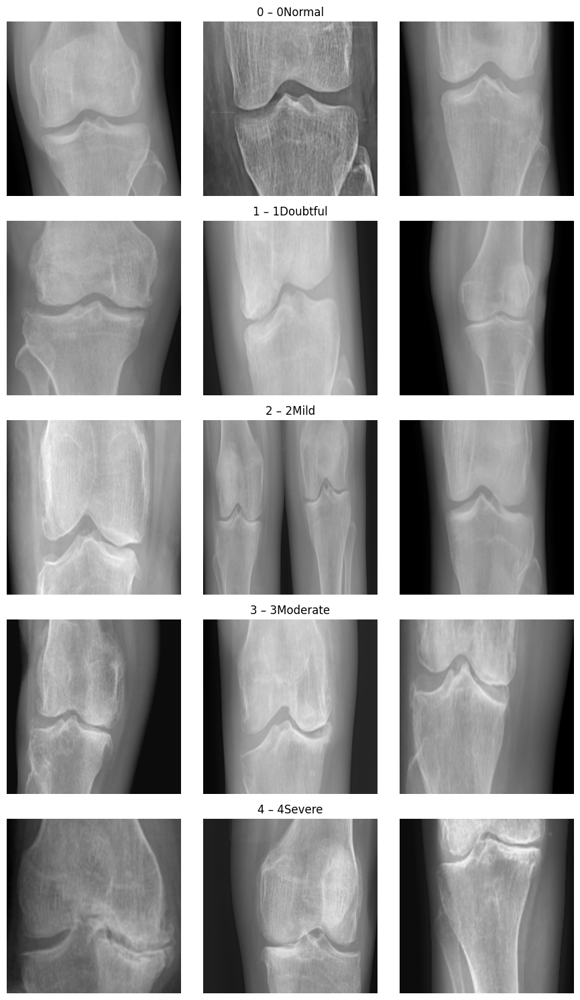

In [ ]:

# 4) Mostrar 3 ejemplos por clase de las imágenes crudas
def show_three_per_class_raw(X, y_lbls, class_names=CLASS_NAMES):
    n_classes = len(class_names)
    per_class = 3
    fig, axes = plt.subplots(n_classes, per_class, figsize=(9, 15))
    for class_idx in range(n_classes):
        idxs = np.where(y_lbls == class_idx)[0][:per_class]
        for j, idx in enumerate(idxs):
            ax = axes[class_idx, j]
            ax.imshow(X[idx])
            ax.axis('off')
            if j == 1:
                ax.set_title(f"{class_idx} – {class_names[class_idx]}", fontsize=12)
    plt.tight_layout()
    plt.show()

# 5) Mostrar 3 ejemplos por clase de las imágenes preprocesadas
def show_three_per_class_proc(X, y_lbls, class_names=CLASS_NAMES):
    n_classes = len(class_names)
    per_class = 3
    fig, axes = plt.subplots(n_classes, per_class, figsize=(9, 15))
    for class_idx in range(n_classes):
        idxs = np.where(y_lbls == class_idx)[0][:per_class]
        for j, idx in enumerate(idxs):
            ax = axes[class_idx, j]
            ax.imshow(X[idx])
            ax.axis('off')
            if j == 1:
                ax.set_title(f"{class_idx} – {class_names[class_idx]}", fontsize=12)
    plt.tight_layout()
    plt.show()

# Uso:
print("Imágenes ANTES del preprocesamiento:")
show_three_per_class_raw(Xr_train, yr_train)



Después del preprocesado

Imágenes DESPUÉS del preprocesamiento:


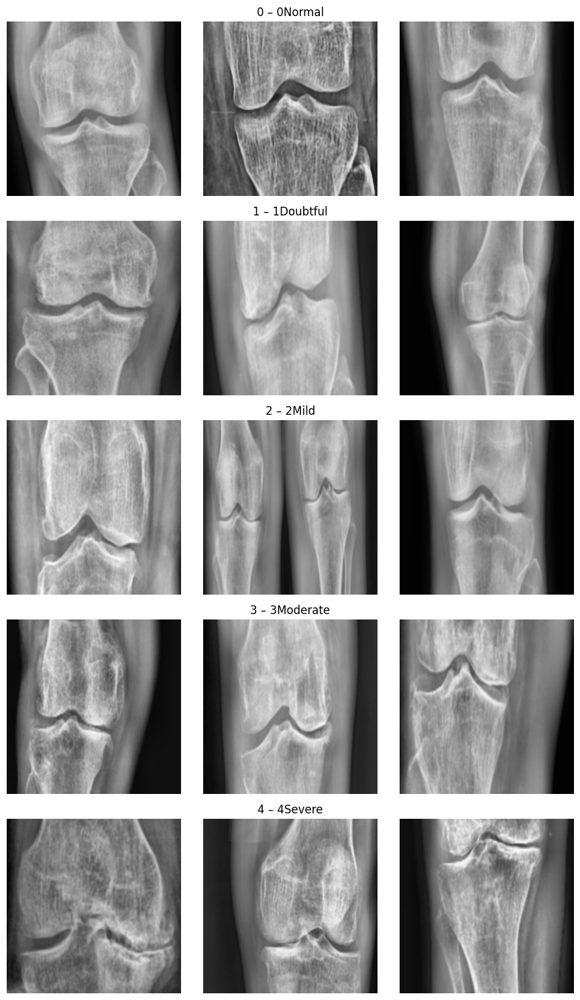

In [ ]:
print("Imágenes DESPUÉS del preprocesamiento:")
show_three_per_class_proc(Xp_train, yr_train)

#### Modeling

##### DataProcessor - Maneja preprocesamiento


In [ ]:
import cv2
import numpy as np

class DataProcessor:
    def __init__(self, class_Names:  list[str], target_shape=(380, 380, 3)):
        self.target_shape = target_shape
        self.class_names = class_Names

    def preprocess_knee_xray(self, img):
        """Preprocesamiento específico para radiografías de rodilla"""
        # Convertir a escala de grises
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # Redimensionar
        gray = cv2.resize(gray, (self.target_shape[0],self.target_shape[1] ), interpolation=cv2.INTER_LINEAR)

        # Normalización Min-Max [0,1]
        gray = gray.astype('float32') / 255.0

        # CLAHE para mejora de contraste
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        gray = clahe.apply((gray * 255).astype('uint8')).astype('float32') / 255.0

        # Filtrado bilateral
        gray = cv2.bilateralFilter((gray * 255).astype('uint8'),
                                 d=5, sigmaColor=75, sigmaSpace=75)
        gray = gray.astype('float32') / 255.0

        # Convertir a 3 canales
        return np.stack([gray, gray, gray], axis=-1)

    def load_dataset(self, data_dir):
        """Carga y preprocesa el dataset completo"""
        images, labels = [], []
        for class_idx, class_name in enumerate(self.class_names):
            class_dir = os.path.join(data_dir, class_name)
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                img = cv2.imread(img_path, cv2.IMREAD_COLOR)
                img_pp = self.preprocess_knee_xray(img)
                images.append(img_pp)
                labels.append(class_idx)
        return np.array(images, dtype='float32'), np.array(labels, dtype='int')

    def preprocessImg(self, Img_input):
        """Carga y preprocesa el dataset completo"""
        img = cv2.imread(Img_input, cv2.IMREAD_COLOR)
        img_pp = self.preprocess_knee_xray(img)
        return img_pp

    def Train_Split(self, X, y,y_categorical, test_size =0.3):
        X_train, X_test, y_train, y_test, y_train_cm, y_test_cm = train_test_split( X, y_categorical, y, test_size=test_size, random_state=42, stratify=y)
        return X_train, X_test, y_train, y_test, y_train_cm, y_test_cm


##### ModelBuilder - Construye el modelo



1. Implementación del módulo CBAM:

 *  la función cbam_block  implementa el mecanismo de atención CBAM completo.

  * CBAM combina dos tipos de atención:

    * Atención por canal: Aprende qué canales son más importantes.

    * Atención espacial: Aprende qué regiones espaciales son más importantes.

2. Integración en los bloques residuales:

    * He modificado el residual_block para incluir un parámetro use_cbam que controla si se aplica el módulo de atención.

    * El CBAM se aplica después de las convoluciones pero antes de la conexión residual.

3. Eliminación del mecanismo de atención simple:

    * He eliminado el mecanismo de atención simple que tenías al final, ya que CBAM proporciona una atención más sofisticada.

Esta implementación debería mejorar la capacidad del modelo para enfocarse en las características más relevantes tanto en la dimensión de los canales como en la espacial, lo que puede ser particularmente útil para la detección de artritis donde ciertas regiones y características pueden ser más indicativas que otras.



In [ ]:
class Utils:
  # Atención espacial
  @staticmethod
  def spatial_average(x):
    return tf.reduce_mean(x, axis=3, keepdims=True)


In [ ]:
from tensorflow.keras import layers, Model

from tensorflow.keras import layers
from tensorflow.keras.layers import Layer, Conv2D, Multiply

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.layers import Layer, Dense, Conv2D, Multiply, Concatenate, Add
from tensorflow.keras.utils import register_keras_serializable

@register_keras_serializable(package="CustomLayers")
class CBAMBlock(Layer):
    def __init__(self, ratio=8, kernel_size=7, **kwargs):
        super().__init__(**kwargs)
        self.ratio       = ratio
        self.kernel_size = kernel_size

        # ————— Channel attention (SE) —————
        # Estos Dense no necesitan build explícito: Keras infiere input dim en su primer call.
        self.dense1 = Dense(
            units=None,            # <-- lo dejamos en None para inferir input_dim dinámicamente
            activation='relu',
            use_bias=True
        )
        self.dense2 = Dense(
            units=None,            # <-- idem
            activation='sigmoid',
            use_bias=True
        )

        # ————— Spatial attention —————
        self.concat_sp = Concatenate(axis=-1)
        self.conv_spatial = Conv2D(
            filters=1,
            kernel_size=self.kernel_size,
            padding='same',
            activation='sigmoid',
            use_bias=False
        )

    def build(self, input_shape):
        # Aquí ajustamos las unidades de los Dense según el número de canales reales
        channels = int(input_shape[-1])
        self.dense1.units = max(channels // self.ratio, 1)
        self.dense2.units = channels
        # Llamamos al super para registrar que ya está "built"
        super().build(input_shape)

    def call(self, inputs):
        # 1) Channel Attention
        avg_pool = tf.reduce_mean(inputs, axis=[1,2], keepdims=True)
        max_pool = tf.reduce_max(inputs, axis=[1,2], keepdims=True)
        mlp_avg  = self.dense2(self.dense1(avg_pool))
        mlp_max  = self.dense2(self.dense1(max_pool))
        channel_att = Add()([mlp_avg, mlp_max])
        x = Multiply()([inputs, channel_att])

        # 2) Spatial Attention
        avg_sp = tf.reduce_mean(x, axis=-1, keepdims=True)
        max_sp = tf.reduce_max(x, axis=-1, keepdims=True)
        cat_sp = self.concat_sp([avg_sp, max_sp])
        spat_att = self.conv_spatial(cat_sp)
        return Multiply()([x, spat_att])

    def get_config(self):
        cfg = super().get_config()
        cfg.update({
            "ratio":       self.ratio,
            "kernel_size": self.kernel_size
        })
        return cfg

    # NO necesitamos compute_output_shape ni build_from_config si todo está en __init__ + get_config

@tf.keras.utils.register_keras_serializable(package="CustomLayers")
class SpatialAttention(Layer):
    def __init__(self, kernel_size=7, **kwargs):
        super().__init__(**kwargs)
        self.kernel_size = kernel_size
        self.conv = Conv2D(
            1,
            kernel_size=self.kernel_size,
            padding='same',
            activation='sigmoid'
        )

    def call(self, inputs):
        avg_pool = tf.reduce_mean(inputs, axis=-1, keepdims=True)
        max_pool = tf.reduce_max(inputs, axis=-1, keepdims=True)
        concat   = tf.concat([avg_pool, max_pool], axis=-1)
        att_map  = self.conv(concat)
        return inputs * att_map

    def get_config(self):
        config = super().get_config()
        config.update({"kernel_size": self.kernel_size})
        return config



class ModelBuilder:
    def __init__(self, input_shape=(380, 380, 3), num_classes=5):
        self.input_shape = input_shape
        self.num_classes = num_classes



    def build_base_model(self):
        """Arquitectura mejorada para detección de artritis con CBAM"""
        base_model = EfficientNetB4(
            weights='imagenet',
            include_top=False,
            #input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3))
            input_shape=(self.input_shape[0], self.input_shape[1], 3))

        # Descongelar las capas convolucionales
        for layer in base_model.layers[-20:]:
            layer.trainable = True

        # Añadir nuevas capas para nuestra tarea
        x = base_model.output
        x = CBAMBlock(ratio=8, kernel_size=7)(x)          # <-- aquí ya es una capa pura
        x = GlobalAveragePooling2D()(x)
        x = Dense(512, activation='relu')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        predictions = Dense(self.num_classes, activation='softmax')(x)

        model = Model(inputs=base_model.input, outputs=predictions)

        return model



##### Training Monitoring -

In [ ]:
# training_monitor.py
import os
import datetime
from tensorflow.keras import callbacks

class TrainingMonitor:
    def __init__(self, save_dir='training_logs'):
        self.save_dir = save_dir
        self.current_run_dir = None
        self.dirs = {}
    def create_directories(self):
        self._setup_directories()

    def _setup_directories(self):
        """Configura la estructura de directorios para el experimento"""
        self.save_dir = os.path.abspath(self.save_dir)
        os.makedirs(self.save_dir, exist_ok=True)
        timestamp = datetime.datetime.now().strftime("%Y-%m-%d-%H:%M:%S")
        self.current_run_dir = os.path.join(self.save_dir, f"run_{timestamp}")

        # Directorios específicos
        self.dirs = {
            'tensorboard': os.path.join(self.current_run_dir, "tensorboard"),
            'checkpoints': os.path.join(self.current_run_dir, "checkpoints"),
            'csv_logs': os.path.join(self.current_run_dir, "csv_logs"),
            'plots': os.path.join(self.current_run_dir, "visualizations")
        }

        for dir_path in self.dirs.values():
            os.makedirs(dir_path, exist_ok=True)
            print(f"Directorio creado: {dir_path}")  # Confirmación visual

    def create_callbacks(self, model_name='model', monitor_metric='val_accuracy', mode='max', patience=200):
        """Factory de callbacks esenciales"""
        print(f"Callbacks configurados en: {self.dirs}")  # Verificación

        return [
            # Callback para guardar el mejor modelo completo
            callbacks.ModelCheckpoint(
                filepath=os.path.join(self.dirs['checkpoints'], f'best_{model_name}.keras'),
                monitor=monitor_metric,
                save_best_only=True,
                save_weights_only=False,
                mode=mode,
                verbose=1
            ),
            # Callback para guardar solo pesos
            callbacks.ModelCheckpoint(
                filepath=os.path.join(self.dirs['checkpoints'], f'{model_name}_weights.weights.h5'),
                monitor=monitor_metric,
                save_best_only=True,
                save_weights_only=True,
                mode=mode,
                verbose=1
            ),
            # Early stopping
            callbacks.EarlyStopping(
                monitor=monitor_metric,
                patience=patience,
                restore_best_weights=True,
                mode=mode
            ),
            # TensorBoard
            callbacks.TensorBoard(
                log_dir=self.dirs['tensorboard'],
                histogram_freq=1,
                profile_batch='500,520'
            ),
            # CSV Logger
            callbacks.CSVLogger(
                filename=os.path.join(self.dirs['csv_logs'], 'training_metrics.csv'),
                separator=',',
                append=False
            ),
            ReduceLROnPlateau(monitor=monitor_metric, factor=0.5, patience=10, verbose=1),
        ]

    def get_tensorboard_cmd(self):
        """Genera el comando para lanzar TensorBoard"""
        return f"tensorboard --logdir {self.dirs['tensorboard']}"

##### Trainer - Maneja entrenamiento y fine-tuning


1. Basado en radiografía de rodilla (KOA)

  Un estudio reciente usó métodos como rotación leve, recorte horizontal y adversarial, descubriendo que rotación y zoom/recorte fueron más útiles que flips o cortes abruptos

  * Rotación limitada (±10°) – ya la tienes
  * Random zoom/crop centrado en la articulación (ej. zoom_range=0.1, crop  90–110% y luego recortar a 380x380).
  * Adversarial augmentation: añadir ruido sutil para robustez.

In [ ]:
from tensorflow.keras import callbacks
import albumentations as A
import sys
import time  # <--- Añadir esto

# trainer.py
class Trainer:
    def __init__(self, keras_model, monitor):
        """
        Args:
            keras_model: Modelo compilado de Keras (no la clase contenedora)
            monitor: Instancia de TrainingMonitor
        """
        self.keras_model = keras_model
        self.monitor = monitor
    def unfreeze_and_finetune(self, model):
      # Descongelar las últimas capas convolucionales
      for layer in model.layers[-20:]:
          if not isinstance(layer, BatchNormalization):
              layer.trainable = True

      model.compile(
          optimizer=Adam(learning_rate=1e-5),  # Tasa de aprendizaje más baja
          loss='categorical_crossentropy',
          metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])

      return model

    def train(self, X_train, y_train, X_val=None, y_val=None,
             batch_size=80, epochs=100, custom_callbacks=None, verbose=1):
        """
        Ejecuta el entrenamiento del modelo Keras

        Args:
            verbose: 0=silencioso, 1=barra de progreso, 2=una línea por época
        """
        callbacks_list = self.monitor.create_callbacks()

        if custom_callbacks:
            callbacks_list.extend(
                custom_callbacks if isinstance(custom_callbacks, list)
                else [custom_callbacks]
            )

        train_datagen = ImageDataGenerator(
            rotation_range=15,
            width_shift_range=0.1,
            height_shift_range=0.1,
            shear_range=0.1,
            zoom_range=0.1,
            horizontal_flip=True,
            fill_mode='nearest')

        train_generator = train_datagen.flow(X_train, y_train, batch_size=batch_size)

        print(">>> DEBUG TYPES <<<")
        print("  x:",   type(X_train),  " y:",   type(y_train))
        print("  val:", type(X_val),    type(y_val))
        print("  batch_size:", batch_size)
        print("  callbacks:", callbacks_list)

        history = self.keras_model.fit(
            train_generator,
            steps_per_epoch=len(X_train) // batch_size,
            validation_data=(X_val, y_val) if X_val is not None else None,
            batch_size=batch_size,
            epochs=epochs,
            callbacks=callbacks_list,
            verbose=1
        )
        results = self.keras_model.evaluate(X_val, y_val, verbose=1)
        loss, acc = results[:2]

        if acc < 0.90:  # Umbral arbitrario
          print("\nIniciando fine-tuning...")
          self.keras_model = self.unfreeze_and_finetune(self.keras_model)

          history = self.keras_model.fit(
              train_generator,
              steps_per_epoch=len(X_train) // batch_size,
              epochs=200,  # Menos épocas para fine-tuning
              validation_data=(X_val, y_val) if X_val is not None else None,
              callbacks=callbacks_list,
              verbose=1)

        sys.stdout.flush()  # Vacía los buffers de salida
        time.sleep(2)
        return history

##### Evaluator - Maneja evaluación y visualización



In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
class Evaluator:
    def __init__(self, class_Names, monitor=None):
        self.monitor = monitor
        self.class_names =class_Names
    def evaluate_model(self, model, X_test, y_test):
        """Evalúa el modelo con soporte para one-hot y labels"""
        # 1. Convertir y_test a labels si está en one-hot
        if y_test.shape[1] > 1:  # Si es one-hot (330, 5)
            y_test_labels = np.argmax(y_test, axis=1)
        else:  # Si ya son labels (330,)
            y_test_labels = y_test

        # 2. Evaluación numérica (adaptada para one-hot)
        metrics = model.evaluate(X_test, y_test, verbose=0)
        if isinstance(metrics, list):
            loss = metrics[0]
            print(f"Pérdida: {loss:.4f}")
            if len(metrics) > 1:
                print("Métricas adicionales:")
                for name, value in zip(model.metrics_names[1:], metrics[1:]):
                    print(f"{name}: {value:.4f}")
        else:
            loss = metrics
            print(f"Pérdida: {loss:.4f}")

        # 3. Generar predicciones
        y_pred = model.predict(X_test)
        y_pred_labels = np.argmax(y_pred, axis=1)  # Convertir probabilidades a labels

        # 4. Reporte de clasificación
        print("\nClassification Report:")
        print(classification_report(
            y_test_labels,
            y_pred_labels,
            target_names=self.class_names,
            digits=4
        ))

        # 5. Matriz de confusión
        self._plot_confusion_matrix(y_test_labels, y_pred_labels)

        return {
            'loss': loss,
            'accuracy': accuracy_score(y_test_labels, y_pred_labels),
            'y_true': y_test_labels,
            'y_pred': y_pred_labels
        }


    def _plot_confusion_matrix(self, y_true, y_pred, classes=None):
        """Visualiza la matriz de confusión"""
        cm = confusion_matrix(y_true, y_pred)
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=classes or range(5),
                    yticklabels=classes or range(5))
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.title('Confusion Matrix')

        if self.monitor and self.monitor.current_run_dir:
            # Asegurarse de que el directorio plots existe
            plots_dir = os.path.join(self.monitor.current_run_dir, "plots")
            os.makedirs(plots_dir, exist_ok=True)  # Esto crea el directorio si no existe

            plot_path = os.path.join(plots_dir, "confusion_matrix.png")
            plt.savefig(plot_path)
        plt.show()


    def _plot_training_history(self, history_dict):
        """Visualiza las métricas de entrenamiento"""
        plt.figure(figsize=(12, 5))
        if not hasattr(history, 'history'):
            print("No hay datos de historial para graficar")
            return
        # Gráfico de pérdida
        plt.subplot(1, 2, 1)
        if 'loss' in history_dict:
            plt.plot(history_dict['loss'], label='Train Loss')
        if 'val_loss' in history_dict:
            plt.plot(history_dict['val_loss'], label='Val Loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()

        # Gráfico de accuracy (si existe)
        plt.subplot(1, 2, 2)
        if 'accuracy' in history_dict:
            plt.plot(history_dict['accuracy'], label='Train Accuracy')
        if 'val_accuracy' in history_dict:
            plt.plot(history_dict['val_accuracy'], label='Val Accuracy')
        plt.title('Training and Validation Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()

        plt.tight_layout()

        if self.monitor and self.monitor.current_run_dir:
            plot_path = os.path.join(self.monitor.current_run_dir, "plots", "training_metrics.png")
            plt.savefig(plot_path)
        plt.show()

##### GradScam - Analysis


In [ ]:
# =============================================
# GRAD-CAM PARA VISUALIZACIÓN DE IMPORTANCIA
# =============================================
import tensorflow as tf
import numpy as np
import matplotlib.cm as cm
import cv2, numpy as np, matplotlib.pyplot as plt

class GradScam:

  def make_gradcam_heatmap(self, img_array, model, last_conv_layer_name, pred_index=None):
    """Genera el heatmap usando Grad-CAM"""
    # Crear modelo que mapea la imagen de entrada a las activaciones
    # de la última capa convolucional y las predicciones
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Calcular el gradiente de la clase predicha (o la especificada) respecto a
    # la última capa convolucional
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # Gradientes de la última capa convolucional respecto a la salida
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # Pooling de los gradientes sobre todos los ejes excepto el de los canales
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiplicar cada canal en el feature map por su importancia
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalizar el heatmap entre 0 y 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy(), pred_index.numpy()

  def visualize_gradcam(self, model, img, last_conv_layer_name, CLASS_NAMES, alpha=0.4):
      # 1) prepara la entrada
      img_array = np.expand_dims(img, axis=0)

      # 2) PRED_INDEX correcto: usa model.predict (con softmax)
      probs = model.predict(img_array)[0]
      pred_index = np.argmax(probs)

      # 3) ahora quita la activación del modelo para Grad-CAM
      original_activation = model.layers[-1].activation
      model.layers[-1].activation = None

      # 4) crea grad_model y genera heatmap (igual que antes)
      heatmap, _ = self.make_gradcam_heatmap(img_array, model, last_conv_layer_name)

      # 5) restaura la activación
      model.layers[-1].activation = original_activation

      # 6) reconstruye la imagen y el heatmap
      img_gray = np.uint8(255 * np.stack([img[...,0]]*3, axis=-1))
      hmap = cv2.resize(heatmap, (img_gray.shape[1], img_gray.shape[0]), interpolation=cv2.INTER_CUBIC)
      hmap = np.uint8(255 * hmap)
      hmap = cv2.applyColorMap(hmap, cv2.COLORMAP_JET)
      superimposed = cv2.addWeighted(img_gray, 1-alpha, hmap, alpha, 0)

      # 7) PLOTEA con el pred_index correcto
      plt.figure(figsize=(12,5))
      plt.subplot(1,3,1)
      plt.imshow(img_gray, cmap='gray')
      plt.title(f"Original\nPred: {CLASS_NAMES[pred_index]}")
      plt.axis('off')

      plt.subplot(1,3,2)
      plt.imshow(hmap)
      plt.title("Heatmap Grad-CAM")
      plt.axis('off')

      plt.subplot(1,3,3)
      plt.imshow(superimposed)
      plt.title("Superposición")
      plt.axis('off')
      plt.tight_layout()
      plt.show()

      return pred_index

  def visualize_clean_gradcam(model, img, last_conv, class_names,
                              alpha=0.5, perc_thr=60, blur_ksize=(3,3)):
      """
      - last_conv: capa (ej. 'block3a_project_conv') salida 48×48
      - perc_thr: percentil de activación (50–70 suele ir bien)
      - blur_ksize: kernel para suavizar antes del threshold
      """
      # 1) pred_index “oficial”
      img_arr = np.expand_dims(img,0)
      probs = model.predict(img_arr)[0]
      pred_idx = np.argmax(probs)

      # 2) Grad-CAM base
      orig_act = model.layers[-1].activation
      model.layers[-1].activation = None


      gradcam_plus_plus = GradcamPlusPlus(loaded_model.model)

      # Define a score function that targets the predicted class
      def score_function(output):
          # The output is a list of logits/predictions.
          # We want to get the score for the predicted class.
          return output[:, np.argmax(output)]

      heatmap = gradcam_plus_plus(
          seed_input=X_test[0],
          score=score_function,
          penultimate_layer=last_conv,
          seek_penultimate_conv_layer=True
      )[0]

      #heatmap, _ = GradScam().make_gradcam_heatmap(img_arr, model, last_conv)
      model.layers[-1].activation = orig_act

      # 3) normalize + blur
      heatmap = np.maximum(heatmap,0)
      if heatmap.max()>0: heatmap /= heatmap.max()
      if blur_ksize: heatmap = cv2.GaussianBlur(heatmap, blur_ksize, 0)

      # 4) threshold dinámico
      thr = np.percentile(heatmap, perc_thr)
      mask = (heatmap >= thr).astype(np.uint8)

      # 5) morfología: abrir (quita puntitos) + cerrar (rellena huecos)
      kernel = np.ones((5,5), np.uint8)
      mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  kernel)
      mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

      # 6) reaplicar mask
      clean_map = heatmap * mask

      # 7) upscale e overlay
      h,w = img.shape[:2]
      up = cv2.resize(clean_map, (w,h), interpolation=cv2.INTER_CUBIC)
      up_uint = np.uint8(255*up)
      cmap = cv2.applyColorMap(up_uint, cv2.COLORMAP_JET)
      gray = np.uint8(255*img[...,0])
      gray_rgb = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
      overlay = cv2.addWeighted(gray_rgb, 1-alpha, cmap, alpha, 0)

      # 8) plot
      fig, ax = plt.subplots(1,3,figsize=(12,4))
      ax[0].imshow(gray, cmap='gray');     ax[0].set_title(f"Original\nPred: {class_names[pred_idx]}")
      ax[1].imshow(cmap);                  ax[1].set_title("Heatmap limpio")
      ax[2].imshow(overlay);               ax[2].set_title("Superposición")
      for a in ax: a.axis('off')
      plt.tight_layout(); plt.show()

      return pred_idx

  def ExecuteInternalAnalysis(self,last_conv_layer_name, model,  X_test, y_test_cm, CLASS_NAMES: list[str]):

    # 1. Identificar la última capa convolucional
    # last_conv_layer_name = None
    # for layer in reversed(model.layers):
    #     if isinstance(layer, (Conv2D, SeparableConv2D)):
    #         last_conv_layer_name = layer.name
    #         break

    print(f"\nÚltima capa convolucional identificada: {last_conv_layer_name}")

    # 2. Ejemplo de visualización con 3 casos de prueba
    sample_indices = [0, len(X_test)//2, -1]  # Primero, medio y último caso

    for idx in sample_indices:
        print(f"\nVisualización Grad-CAM para caso {CLASS_NAMES[y_test_cm[idx]]} real")
        # Note: visualize_gradcam now handles restoring the activation internally
        pred_class = self.visualize_gradcam(
            model,
            X_test[idx],
            last_conv_layer_name, CLASS_NAMES)

        # Mostrar probabilidades completas
        # Predict again *after* restoring the activation for correct probabilities
        probs = model.predict(np.expand_dims(X_test[idx], axis=0))[0]
        for i, (class_name, prob) in enumerate(zip(CLASS_NAMES, probs)):
            print(f"{class_name}: {prob*100:.2f}%{' <- PREDICCIÓN' if i == pred_class else ''}")

    def ExecuteGradCamAnalysis(self, model, X_test,CLASS_NAMES: list[str] ):

      # 1. Identificar la última capa convolucional
      last_conv_layer_name = None
      for layer in reversed(model.layers):
          if isinstance(layer, (Conv2D, SeparableConv2D)):
            last_conv_layer_name = layer.name
            break

      print(f"\nÚltima capa convolucional identificada: {last_conv_layer_name}")
      pred_class = self.visualize_gradcam(
          model,
          X_test,
          last_conv_layer_name, CLASS_NAMES)


      # Mostrar probabilidades completas
      # Predict again *after* restoring the activation for correct probabilities
      probs = model.predict(np.expand_dims(X_test, axis=0))[0]
      for i, (class_name, prob) in enumerate(zip(CLASS_NAMES, probs)):
          print(f"{class_name}: {prob*100:.2f}%{' <- PREDICCIÓN' if i == pred_class else ''}")

#####  Módulo ModelSerializer


In [ ]:
import pickle
import tensorflow as tf
from pathlib import Path

from tensorflow.keras.callbacks import Callback
# model_serializer.py
import json, os, datetime
from pathlib import Path
import tensorflow as tf

# ===== Registra aquí cualquier capa/función custom =====
CUSTOM_OBJECTS = {
    'spatial_average': Utils.spatial_average  # añade más si los usas
}
tf.keras.utils.get_custom_objects().update(CUSTOM_OBJECTS)
# =======================================================
# callbacks.py
from tensorflow.keras.callbacks import Callback

class SaveBestKerasCallback(Callback):
    """
    Guarda el .keras + metadata.json cuando la métrica monitorizada mejora.
    """
    def __init__(self, arthritis_model, export_dir,
                 monitor="val_accuracy", mode="max"):
        super().__init__()
        self.arthritis_model = arthritis_model
        self.export_dir      = export_dir
        self.monitor         = monitor
        self.mode            = mode
        self.best_val        = -float("inf") if mode == "max" else float("inf")

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get(self.monitor)
        if current is None:  # métrica inexistente
            return

        improved = (current > self.best_val) if self.mode == "max" else (current < self.best_val)
        if improved:
            self.best_val = current
            ModelSerializer.save(self.arthritis_model, self.export_dir)
            print(f"\n💾 Epoch {epoch:03d} – {self.monitor} mejoró a {current:.4f}. Modelo guardado.")


class ModelSerializer:
    """
    Guarda y carga la instancia ArthritisDetectionModel:
      • modelo Keras ⇒ formate .keras
      • metadatos      ⇒ metadata.json
    """
    MODEL_NAME   = "model.keras"
    METADATA_NM  = "metadata.json"

    # ---------- GUARDAR ----------
    @staticmethod
    def save(arthritis_model, export_dir: str | Path):
        export_dir = Path(export_dir)
        export_dir.mkdir(parents=True, exist_ok=True)

        # 1) Modelo completo (.keras)
        model_path = export_dir / ModelSerializer.MODEL_NAME
        arthritis_model.model.layers[-1].activation = tf.keras.activations.softmax

        arthritis_model.model.save(model_path, include_optimizer=True)
        print(f"✅ Modelo guardado en {model_path}")

        # 2) Metadatos JSON
        metadata = {
            "processor_config": {
                "target_shape": arthritis_model.data_processor.target_shape,
                "class_Names":  arthritis_model.data_processor.class_names
            },
            "builder_config": {
                "input_shape": arthritis_model.model_builder.input_shape,
                "num_classes": arthritis_model.model_builder.num_classes
            },
            "monitor_config": {
                "save_dir":        arthritis_model.monitor.save_dir,
                "current_run_dir": arthritis_model.monitor.current_run_dir,
                "dirs":            arthritis_model.monitor.dirs
            },
            "export_date": datetime.datetime.now().isoformat()
        }
        with open(export_dir / ModelSerializer.METADATA_NM, "w", encoding="utf-8") as f:
            json.dump(metadata, f, indent=2)
        print(f"✅ Metadatos guardados en {export_dir / ModelSerializer.METADATA_NM}")

    # ---------- CARGAR ----------
    @staticmethod
    def load(export_dir: str | Path):
        export_dir = Path(export_dir)

        # 0) Comprobaciones
        model_path = export_dir / ModelSerializer.MODEL_NAME
        meta_path  = export_dir / ModelSerializer.METADATA_NM
        if not model_path.exists() or not meta_path.exists():
            raise FileNotFoundError("No se encontraron model.keras y/o metadata.json")

        # 1) Cargar metadatos
        with open(meta_path, "r", encoding="utf-8") as f:
            metadata = json.load(f)

        # 2) Reconstruir objetos auxiliares
        loaded = ArthritisDetectionModel(
            class_Names = metadata["processor_config"]["class_Names"],
            save_dir    = metadata["monitor_config"]["save_dir"],
            input_shape = tuple(metadata["builder_config"]["input_shape"])
        )

        # 3) Sobrescribir monitor con la estructura original
        loaded.monitor.current_run_dir = metadata["monitor_config"]["current_run_dir"]
        loaded.monitor.dirs            = metadata["monitor_config"]["dirs"]

        # 4) Cargar modelo Keras con objetos custom
        loaded.model = tf.keras.models.load_model(
            model_path,
            custom_objects=CUSTOM_OBJECTS
        )

        # 5) Actualizar trainer y evaluator
        loaded.trainer   = Trainer(loaded.model, loaded.monitor)
        loaded.evaluator = Evaluator(loaded.data_processor.class_names, loaded.monitor)

        print(f"✅ Modelo restaurado desde {model_path}")
        return loaded

##### ArthritisDetectionModel - Clase Principal con Composición


In [ ]:
class ArthritisDetectionModel:
    def __init__(self,class_Names : list[str], save_dir='_logger', input_shape=(380, 380, 3)):
        self.train_datagen = None
        self.data_processor = DataProcessor(class_Names=class_Names, target_shape=input_shape)
        self.model_builder = ModelBuilder(input_shape=input_shape)
        self.monitor =  TrainingMonitor(save_dir)
        self.evaluator = Evaluator(class_Names, self.monitor)
        self.model = None  # Modelo interno de Keras
        self.history = None
        self.trainer = None  # Se inicializará después de compilar
        # 2. Aumentación de datos específica para radiografías

    def _ensure_compiled(self):
        """Garantiza que el modelo está construido y compilado"""
        if self.model is None:
            self.model = self.model_builder.build_base_model()
            self.model.compile(
                optimizer=tf.keras.optimizers.Adam(1e-4),
                loss='categorical_crossentropy',
                metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
            )

            self.trainer = Trainer(self.model, self.monitor)



    def train(self, X_train, y_train, X_val, y_val, **kwargs):
        """Entrena el modelo"""
        self.monitor.create_directories()
        sys.stdout.flush()  # Vacía los buffers de salida
        time.sleep(2)
        # Garantizar modelo listo
        self._ensure_compiled()

        # Entrenamiento
        self.history = self.trainer.train(
            X_train, y_train,
            X_val=X_val,
            y_val=y_val,
            verbose=1,
            **kwargs
        )

        return self.history

    def evaluate(self, X_test, y_test):
      """Evalúa el modelo con preprocesamiento automático"""
      try:
          if self.monitor is None:
            print('Monitor is not initialized')
            raise
          # Preprocesamiento automático
          return self.evaluator.evaluate_model(self.model, X_test, y_test)
      except Exception as e:
          print(f"Error durante la evaluación: {str(e)}")
          raise

    def predict(self, X):
        return self.model.predict(X)

    def save(self, filepath):
        """Guarda el modelo completo"""
        ModelSerializer.save(self, filepath)

    @classmethod
    def load(cls, filepath):
        """Carga un modelo guardado"""
        return ModelSerializer.load(filepath)

#### Executing -models

##### Running

In [ ]:
from tensorflow.keras.callbacks import LearningRateScheduler

def lr_schedule(epoch):
    """Ejemplo de callback personalizado"""
    if epoch < 5:
        return 0.001
    return 0.0001

In [ ]:
data_dir='../Training'
save_dir='./_logger_efficient_net'
BATCH_SIZE = 32
EPOCHS = 80

In [ ]:
# Inicialización
# Callbacks adicionales

model = ArthritisDetectionModel(class_Names = ['0Normal', '1Doubtful', '2Mild', '3Moderate', '4Severe'], save_dir=save_dir)



In [ ]:
preprocesor = DataProcessor(class_Names = ['0Normal', '1Doubtful', '2Mild', '3Moderate', '4Severe'], target_shape=(380, 380, 3))
X, y = preprocesor.load_dataset(data_dir)
y_categorical = tf.keras.utils.to_categorical(y, num_classes=5)

X_train, X_test, y_train, y_test, y_train_cm, y_test_cm = preprocesor.Train_Split(X, y,y_categorical, test_size=0.2)
X_val, y_val = X_train[-60:], y_train[-60:]
X_train, y_train = X_train[:-60], y_train[:-60]

In [ ]:
print(y_test_cm[0])

4


In [ ]:
mk_cb = SaveBestKerasCallback(model, 'best_model_efficient_net.keras')
custom_cb = LearningRateScheduler(lr_schedule)


In [ ]:

# 2. Entrenar modelo
# Entrenamiento con callbacks preconfigurados + personalizados
history = model.train(
    X_train, y_train,
    X_val=X_val,
    y_val=y_val,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    custom_callbacks=[ mk_cb]  # Opcional
)



Directorio creado: /content/drive/MyDrive/Colab Notebooks/Capstone Project/Modeling/Efficient-Net/_logger_efficient_net/run_2025-07-14-04:12:22/tensorboard
Directorio creado: /content/drive/MyDrive/Colab Notebooks/Capstone Project/Modeling/Efficient-Net/_logger_efficient_net/run_2025-07-14-04:12:22/checkpoints
Directorio creado: /content/drive/MyDrive/Colab Notebooks/Capstone Project/Modeling/Efficient-Net/_logger_efficient_net/run_2025-07-14-04:12:22/csv_logs
Directorio creado: /content/drive/MyDrive/Colab Notebooks/Capstone Project/Modeling/Efficient-Net/_logger_efficient_net/run_2025-07-14-04:12:22/visualizations
Callbacks configurados en: {'tensorboard': '/content/drive/MyDrive/Colab Notebooks/Capstone Project/Modeling/Efficient-Net/_logger_efficient_net/run_2025-07-14-04:12:22/tensorboard', 'checkpoints': '/content/drive/MyDrive/Colab Notebooks/Capstone Project/Modeling/Efficient-Net/_logger_efficient_net/run_2025-07-14-04:12:22/checkpoints', 'csv_logs': '/content/drive/MyDrive/Co

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/80
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.2988 - auc: 0.5922 - loss: 2.1881
Epoch 1: val_accuracy improved from -inf to 0.18333, saving model to /content/drive/MyDrive/Colab Notebooks/Capstone Project/Modeling/Efficient-Net/_logger_efficient_net/run_2025-07-14-04:12:22/checkpoints/best_model.keras

Epoch 1: val_accuracy improved from -inf to 0.18333, saving model to /content/drive/MyDrive/Colab Notebooks/Capstone Project/Modeling/Efficient-Net/_logger_efficient_net/run_2025-07-14-04:12:22/checkpoints/model_weights.weights.h5
✅ Modelo guardado en best_model_efficient_net.keras/model.keras
✅ Metadatos guardados en best_model_efficient_net.keras/metadata.json

💾 Epoch 000 – val_accuracy mejoró a 0.1833. Modelo guardado.
39/39 ━━━━━━━━━━━━━━━━━━━━ 275s 3s/step - accuracy: 0.2995 - auc: 0.5933 - loss: 2.1839 - val_accuracy: 0.1833 - val_auc: 0.4488 - val_loss: 1.6541 - learning_rate: 1.0000e-04
Epoch 2/80
 1/39 ━━━━━━━━━━━━━━━━━━━━ 7s 206ms/step - accuracy: 0.3750 - auc

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


39/39 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - accuracy: 0.3750 - auc: 0.6450 - loss: 2.1683 - val_accuracy: 0.1833 - val_auc: 0.4383 - val_loss: 1.6545 - learning_rate: 1.0000e-04
Epoch 3/80
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 913ms/step - accuracy: 0.4414 - auc: 0.7554 - loss: 1.5275
Epoch 3: val_accuracy did not improve from 0.18333

Epoch 3: val_accuracy did not improve from 0.18333
39/39 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.4421 - auc: 0.7558 - loss: 1.5259 - val_accuracy: 0.1000 - val_auc: 0.3767 - val_loss: 1.6305 - learning_rate: 1.0000e-04
Epoch 4/80
 1/39 ━━━━━━━━━━━━━━━━━━━━ 6s 184ms/step - accuracy: 0.3438 - auc: 0.7579 - loss: 1.5070
Epoch 4: val_accuracy did not improve from 0.18333

Epoch 4: val_accuracy did not improve from 0.18333
39/39 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - accuracy: 0.3438 - auc: 0.7579 - loss: 1.5070 - val_accuracy: 0.1000 - val_auc: 0.3770 - val_loss: 1.6302 - learning_rate: 1.0000e-04
Epoch 5/80
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 923ms/step - accuracy: 0

In [ ]:
ModelSerializer.save(model, "./export/best_model_efficient_net/")


✅ Modelo guardado en export/best_model_efficient_net/model.keras
✅ Metadatos guardados en export/best_model_efficient_net/metadata.json


In [ ]:
print("Shape de X_test:", X_test.shape)
print("Shape de y_test:", y_test.shape)

Shape de X_test: (330, 380, 380, 3)
Shape de y_test: (330, 5)


✅ Modelo restaurado desde best_model_efficient_net.keras/model.keras
Pérdida: 0.4858
Métricas adicionales:
compile_metrics: 0.8818
11/11 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step

Classification Report:
              precision    recall  f1-score   support

     0Normal     0.8807    0.9320    0.9057       103
   1Doubtful     0.8404    0.8229    0.8316        96
       2Mild     0.8750    0.7609    0.8140        46
   3Moderate     0.8800    1.0000    0.9362        44
     4Severe     1.0000    0.9024    0.9487        41

    accuracy                         0.8818       330
   macro avg     0.8952    0.8837    0.8872       330
weighted avg     0.8829    0.8818    0.8807       330



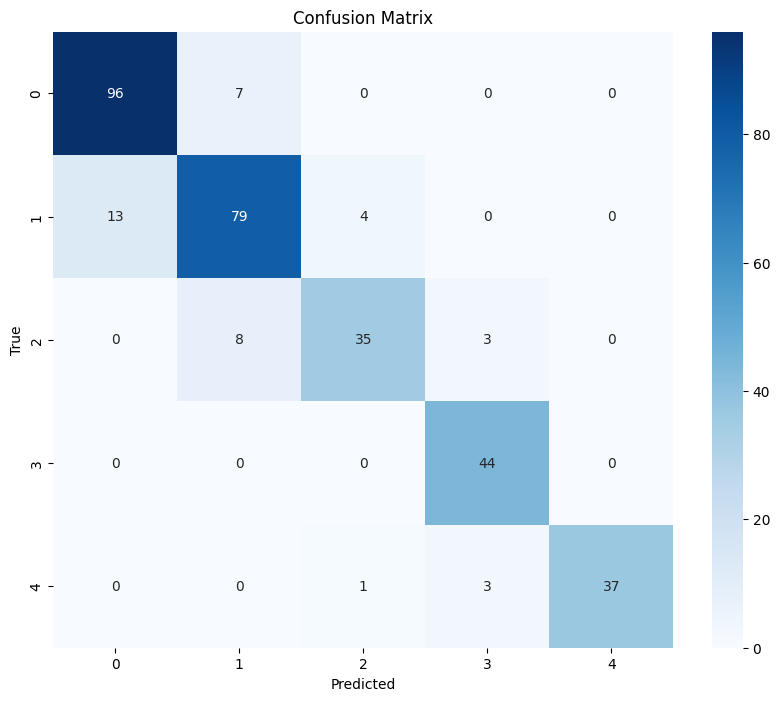

In [ ]:
# 3. Evaluar

loaded_model = ModelSerializer.load('./best_model_efficient_net.keras')

results = loaded_model.evaluate(X_test, y_test)


In [ ]:

# 4. Usar para predicciones
sample_images = X_test[:5]  # 5 imágenes de ejemplo
predictions = loaded_model.predict(sample_images)



1/1 ━━━━━━━━━━━━━━━━━━━━ 23s 23s/step


In [ ]:
loaded_model.monitor.get_tensorboard_cmd()

'tensorboard --logdir /content/drive/MyDrive/Colab Notebooks/Capstone Project/Modeling/Efficient-Net/_logger_efficient_net/run_2025-07-14-04:12:22/tensorboard'

In [ ]:
# Usa la ruta exacta que imprimiste anteriormente
!kill 26471

%reload_ext tensorboard
%tensorboard --logdir _logger_efficient_net/'run_2025-07-14-04:12:22'/tensorboard --host 0.0.0.0

Output hidden; open in https://colab.research.google.com to view.

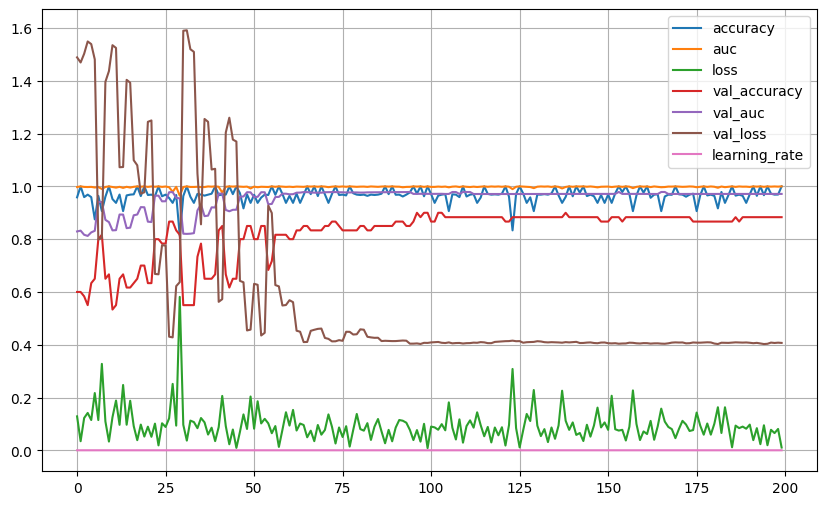

In [ ]:
import pandas as pd
history_df = pd.DataFrame(model.history.history)
history_df.plot(figsize=(10, 6))
plt.grid(True)
plt.show()

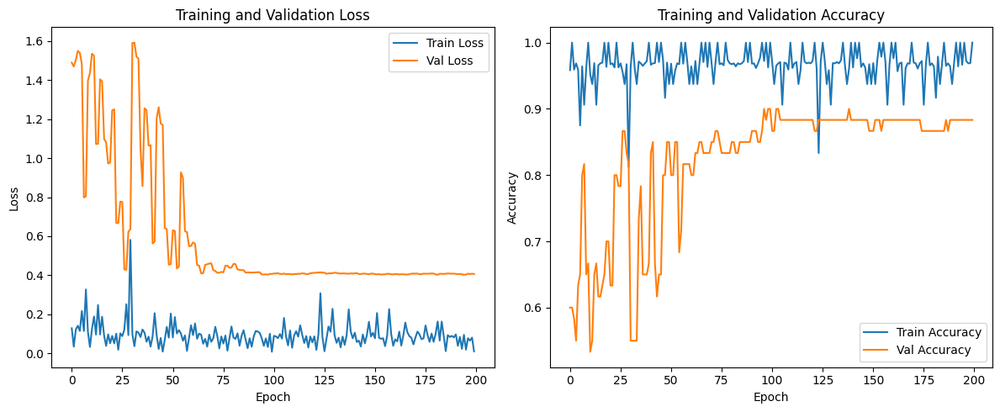

In [ ]:
evaluator = Evaluator(class_Names = ['0Normal', '1Doubtful', '2Mild', '3Moderate', '4Severe'])
evaluator._plot_training_history(model.history.history)

In [ ]:
type(loaded_model)

__main__.ArthritisDetectionModel

In [ ]:
last_conv_layer_name = None
for layer in reversed(loaded_model.model.layers):
    print(layer.name)
    if isinstance(layer, (Conv2D, SeparableConv2D)):
        last_conv_layer_name = layer.name
        break

dense_11
dropout_2
batch_normalization_2
dense_10
global_average_pooling2d_2
cbam_block_2
top_activation
top_bn
top_conv


In [ ]:
from tensorflow.keras.layers import Multiply

# Listar todas las capas Multiply con su resolución
mult_layers = [
    (layer.name, layer.output.shape[1], layer.output.shape[2])
    for layer in loaded_model.model.layers
    if isinstance(layer, Multiply)
]
# Elegir la de mayor resolución espacial
print(mult_layers)

best_mult = min(
    reversed(mult_layers),
    key=lambda x: x[1] * x[2]
)[0]
print("Usaremos para Grad-CAM la capa:", best_mult)


[('block1a_se_excite', 190, 190), ('block1b_se_excite', 190, 190), ('block2a_se_excite', 95, 95), ('block2b_se_excite', 95, 95), ('block2c_se_excite', 95, 95), ('block2d_se_excite', 95, 95), ('block3a_se_excite', 48, 48), ('block3b_se_excite', 48, 48), ('block3c_se_excite', 48, 48), ('block3d_se_excite', 48, 48), ('block4a_se_excite', 24, 24), ('block4b_se_excite', 24, 24), ('block4c_se_excite', 24, 24), ('block4d_se_excite', 24, 24), ('block4e_se_excite', 24, 24), ('block4f_se_excite', 24, 24), ('block5a_se_excite', 24, 24), ('block5b_se_excite', 24, 24), ('block5c_se_excite', 24, 24), ('block5d_se_excite', 24, 24), ('block5e_se_excite', 24, 24), ('block5f_se_excite', 24, 24), ('block6a_se_excite', 12, 12), ('block6b_se_excite', 12, 12), ('block6c_se_excite', 12, 12), ('block6d_se_excite', 12, 12), ('block6e_se_excite', 12, 12), ('block6f_se_excite', 12, 12), ('block6g_se_excite', 12, 12), ('block6h_se_excite', 12, 12), ('block7a_se_excite', 12, 12), ('block7b_se_excite', 12, 12)]
Usa

In [ ]:
conv_layers = [
    (l.name, l.output.shape[1], l.output.shape[2])
    for l in loaded_model.model.layers if isinstance(l, (Conv2D, SeparableConv2D))
]
# Filtrar resoluciones intermedias
candidates = [c for c in conv_layers if 14 <= c[1] <= 56]
best = max(candidates, key=lambda x: x[1]*x[2])[0]
print("Usando capa:", best)


Usando capa: block3a_project_conv


In [ ]:
from tensorflow.keras.layers import Conv2D, SeparableConv2D

conv_layers = [
    (l.name, l.output.shape[1], l.output.shape[2])
    for l in loaded_model.model.layers
    if isinstance(l, (Conv2D, SeparableConv2D))
]
for name, h, w in conv_layers:
    print(f"{name:30s} → {h}×{w}")


stem_conv                      → 190×190
block1a_se_reduce              → 1×1
block1a_se_expand              → 1×1
block1a_project_conv           → 190×190
block1b_se_reduce              → 1×1
block1b_se_expand              → 1×1
block1b_project_conv           → 190×190
block2a_expand_conv            → 190×190
block2a_se_reduce              → 1×1
block2a_se_expand              → 1×1
block2a_project_conv           → 95×95
block2b_expand_conv            → 95×95
block2b_se_reduce              → 1×1
block2b_se_expand              → 1×1
block2b_project_conv           → 95×95
block2c_expand_conv            → 95×95
block2c_se_reduce              → 1×1
block2c_se_expand              → 1×1
block2c_project_conv           → 95×95
block2d_expand_conv            → 95×95
block2d_se_reduce              → 1×1
block2d_se_expand              → 1×1
block2d_project_conv           → 95×95
block3a_expand_conv            → 95×95
block3a_se_reduce              → 1×1
block3a_se_expand              → 1×1
block3


Última capa convolucional identificada: block7b_project_conv

Visualización Grad-CAM para caso 4Severe real
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_2']]
Received: inputs=Tensor(shape=(1, 380, 380, 3))
  warnings.warn(msg)


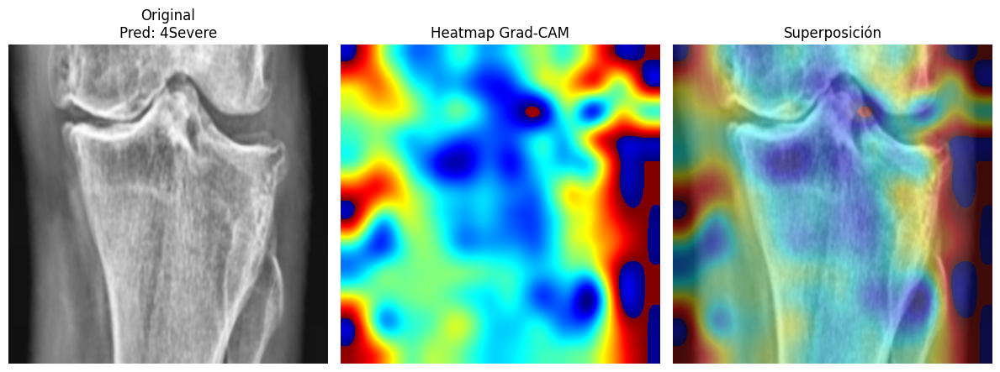

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
0Normal: 0.00%
1Doubtful: 0.00%
2Mild: 1.12%
3Moderate: 0.00%
4Severe: 98.88% <- PREDICCIÓN

Visualización Grad-CAM para caso 3Moderate real
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


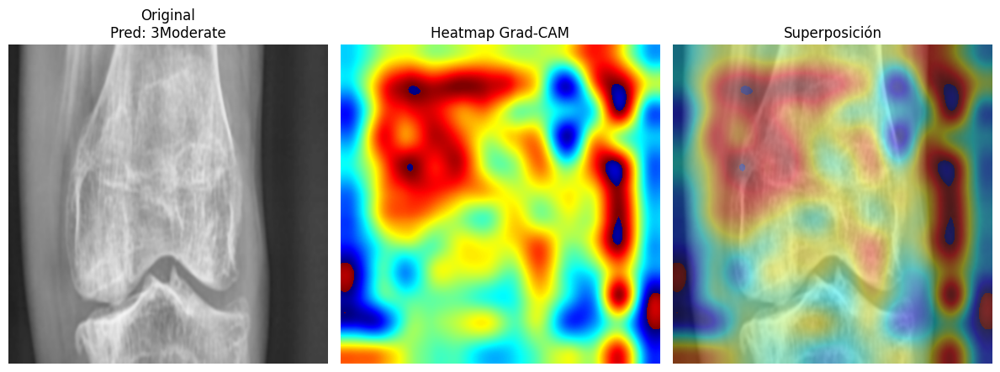

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
0Normal: 0.00%
1Doubtful: 0.00%
2Mild: 0.00%
3Moderate: 100.00% <- PREDICCIÓN
4Severe: 0.00%

Visualización Grad-CAM para caso 3Moderate real
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


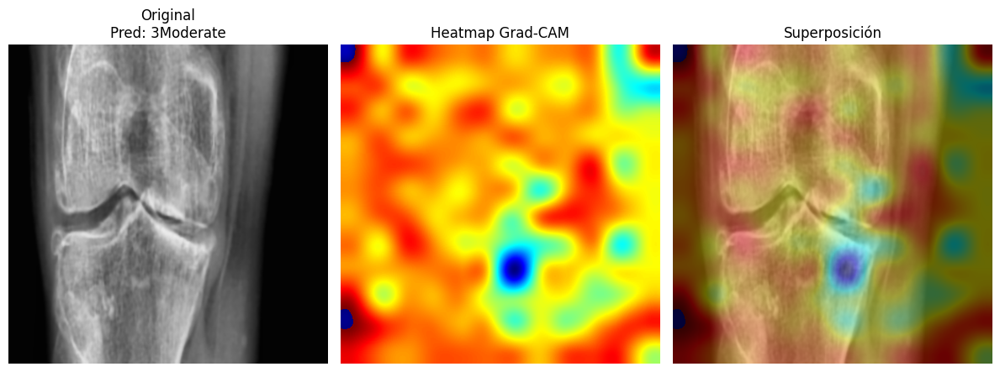

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
0Normal: 0.00%
1Doubtful: 0.00%
2Mild: 0.00%
3Moderate: 99.87% <- PREDICCIÓN
4Severe: 0.13%


In [ ]:
gradScam = GradScam()
gradScam.ExecuteInternalAnalysis(
    'block7b_project_conv',
    model=loaded_model.model,
    X_test=X_test,
    y_test_cm=y_test_cm,
    CLASS_NAMES=['0Normal', '1Doubtful', '2Mild', '3Moderate', '4Severe']
)

#### Importing isolated

In [ ]:
from tensorflow.keras.models import load_model
import tensorflow as tf
# ===== Registra aquí cualquier capa/función custom =====
from tensorflow.keras.models import load_model

custom_objects = {
    'spatial_average': Utils.spatial_average
}

# ✅ ¡Importante! Esto NO es el archivo .keras, es la carpeta que lo contiene
model = load_model("./export/best_model_efficient_net/model.keras", custom_objects=custom_objects)


# You can now use the loaded model for prediction or further training
# For example, to print the model summary:
model.summary()


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 380, 380,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_4         │ (None, 380, 380,  │          0 │ input_layer_2[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_2     │ (None, 380, 380,  │          7 │ rescaling_4[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_5         │ (None, 380, 380,  │          0 │ normalization_2[… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 381, 381,  │          0 │ rescaling_5[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 190, 190,  │      1,296 │ stem_conv_pad[0]… │
│                     │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 190, 190,  │        192 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 190, 190,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 190, 190,  │        432 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 190, 190,  │        192 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 190, 190,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 48)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 48)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 12)  │        588 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 48)  │        624 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 190, 190,  │          0 │ block1a_activati… │
│ (Multiply)          │ 48)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 190, 190,  │      1,152 │ block1a_se_excit

 Total params: 57,951,686 (221.07 MB)

 Trainable params: 19,275,151 (73.53 MB)

 Non-trainable params: 126,231 (493.09 KB)

 Optimizer params: 38,550,304 (147.06 MB)

In [ ]:
results = model.evaluate(X_test, y_test)


11/11 ━━━━━━━━━━━━━━━━━━━━ 20s 590ms/step - accuracy: 0.8968 - auc: 0.9773 - loss: 0.4253



Última capa convolucional identificada: block7b_se_excite

Visualización Grad-CAM para caso 4Severe real
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step


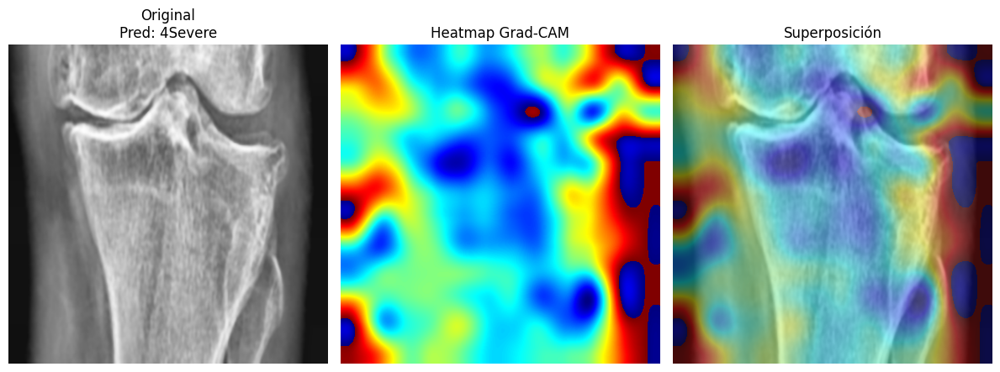

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
0Normal: 0.00%
1Doubtful: 0.00%
2Mild: 1.12%
3Moderate: 0.00%
4Severe: 98.88% <- PREDICCIÓN

Visualización Grad-CAM para caso 3Moderate real
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


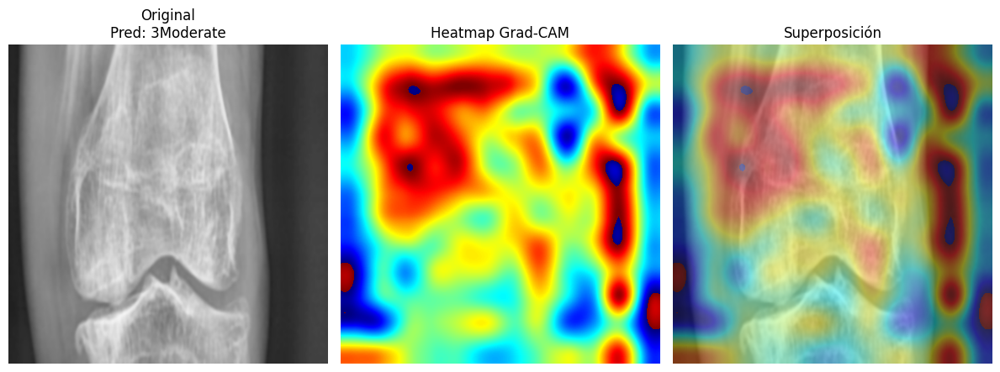

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
0Normal: 0.00%
1Doubtful: 0.00%
2Mild: 0.00%
3Moderate: 100.00% <- PREDICCIÓN
4Severe: 0.00%

Visualización Grad-CAM para caso 3Moderate real
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


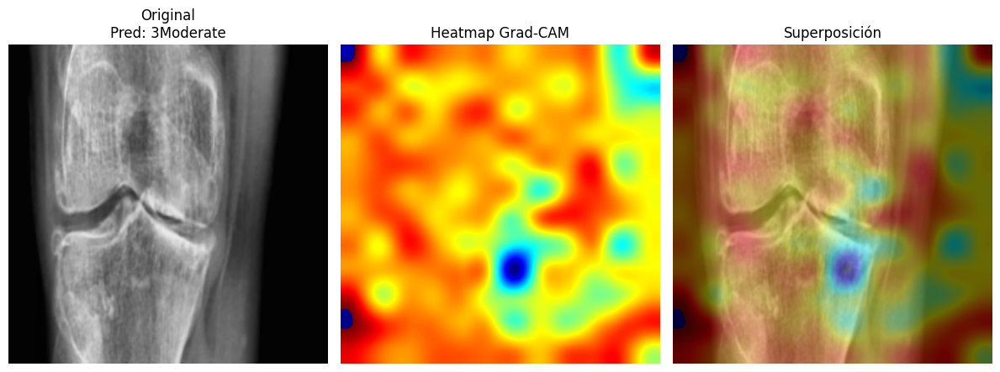

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
0Normal: 0.00%
1Doubtful: 0.00%
2Mild: 0.00%
3Moderate: 99.87% <- PREDICCIÓN
4Severe: 0.13%


In [ ]:
gradScam = GradScam()
gradScam.ExecuteInternalAnalysis(
    'block7b_se_excite',
    model=model,
    X_test=X_test,
    y_test_cm=y_test_cm,
    CLASS_NAMES=['0Normal', '1Doubtful', '2Mild', '3Moderate', '4Severe']
)

In [ ]:
# 4. Usar para predicciones
sample_images = X_test[:1]  # 5 imágenes de ejemplo
predictions = model.predict(sample_images)
print(predictions)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
[[3.2627457e-07 1.8336292e-05 1.1185926e-02 2.0262136e-05 9.8877513e-01]]


In [ ]:

# Ruta donde están `model.keras` y `metadata.json`
export_dir = "./export/best_model_efficient_net"
# Carga completa
arthritis_model = ModelSerializer.load(export_dir)


✅ Modelo restaurado desde export/best_model_efficient_net/model.keras


Pérdida: 0.4858
Métricas adicionales:
compile_metrics: 0.8818
11/11 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step

Classification Report:
              precision    recall  f1-score   support

     0Normal     0.8807    0.9320    0.9057       103
   1Doubtful     0.8404    0.8229    0.8316        96
       2Mild     0.8750    0.7609    0.8140        46
   3Moderate     0.8800    1.0000    0.9362        44
     4Severe     1.0000    0.9024    0.9487        41

    accuracy                         0.8818       330
   macro avg     0.8952    0.8837    0.8872       330
weighted avg     0.8829    0.8818    0.8807       330



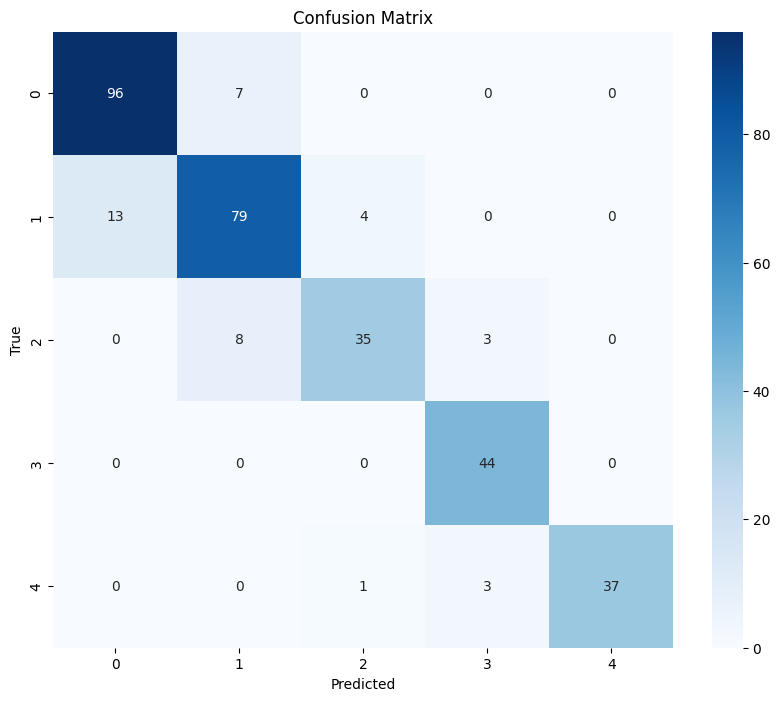

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step

Última capa convolucional identificada: block7b_se_excite

Visualización Grad-CAM para caso 4Severe real
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_2']]
Received: inputs=Tensor(shape=(1, 380, 380, 3))
  warnings.warn(msg)


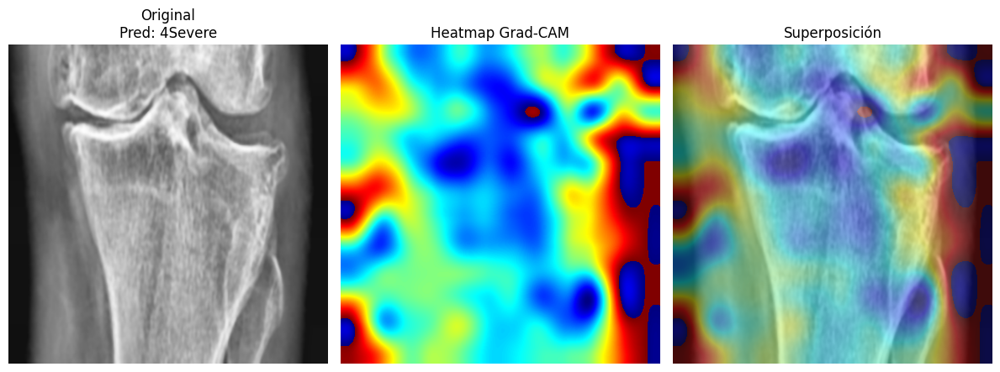

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
0Normal: 0.00%
1Doubtful: 0.00%
2Mild: 1.12%
3Moderate: 0.00%
4Severe: 98.88% <- PREDICCIÓN

Visualización Grad-CAM para caso 3Moderate real
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


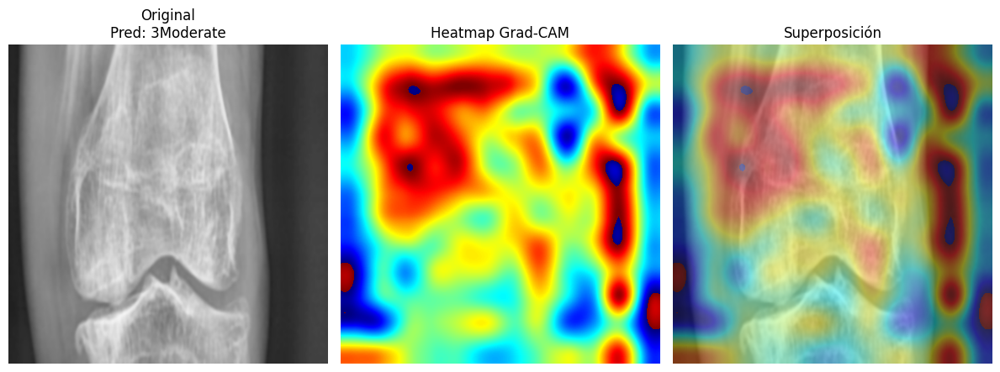

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
0Normal: 0.00%
1Doubtful: 0.00%
2Mild: 0.00%
3Moderate: 100.00% <- PREDICCIÓN
4Severe: 0.00%

Visualización Grad-CAM para caso 3Moderate real
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


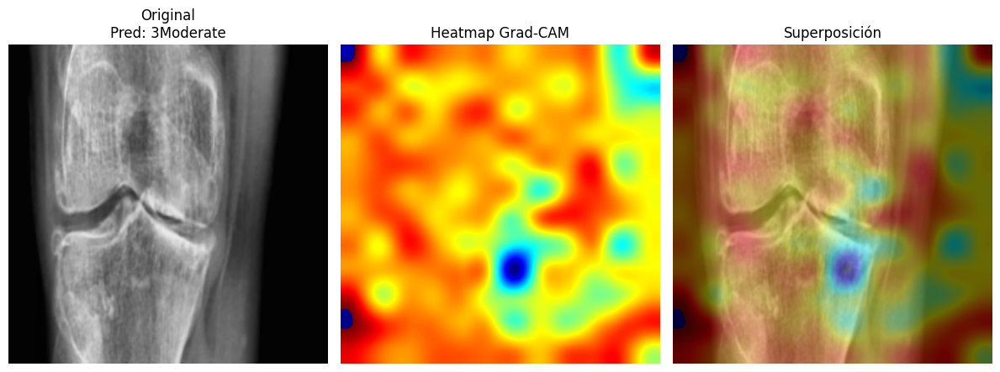

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
0Normal: 0.00%
1Doubtful: 0.00%
2Mild: 0.00%
3Moderate: 99.87% <- PREDICCIÓN
4Severe: 0.13%


In [ ]:
# Evaluación
arthritis_model.evaluate(X_test, y_test)

# Predicciones
preds = arthritis_model.predict(X_test[:5])

# Visualizaciones Grad-CAM
gradScam = GradScam()
gradScam.ExecuteInternalAnalysis(
    last_conv_layer_name="block7b_se_excite",
    model=arthritis_model.model,
    X_test=X_test,
    y_test_cm=y_test_cm,
    CLASS_NAMES=arthritis_model.data_processor.class_names
)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


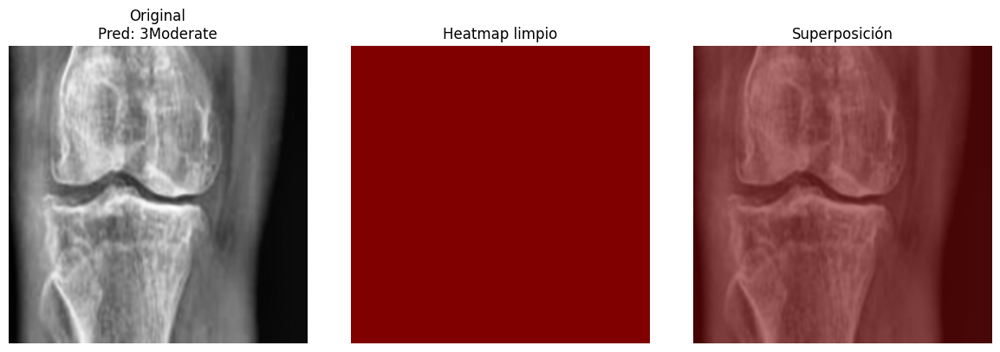

In [ ]:
last_conv = "block7b_se_excite"  # 95×95
gradScam = GradScam()
pred = GradScam.visualize_clean_gradcam(
    loaded_model.model,
    X_test[6],  # Use a single image for visualization
    last_conv,
    ['0Normal', '1Doubtful', '2Mild', '3Moderate', '4Severe'], # class_names
    alpha=0.5,
    blur_ksize=(5,5),
    perc_thr=85                 # quita todo <85º percentil
)